In [1]:
# Packages and adjustments to the figures
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np
import math
import pandas as pd 
from data import data

In [2]:
data

[1.48,
 1.47,
 1.5,
 1.51,
 1.5,
 1.51,
 1.49,
 1.52,
 1.51,
 1.52,
 1.52,
 1.51,
 1.51,
 1.51,
 1.51,
 1.51,
 1.49,
 1.51,
 1.51,
 1.54,
 1.52,
 1.5,
 1.54,
 1.52,
 1.52,
 1.53,
 1.53,
 1.54,
 1.53,
 1.53,
 1.55,
 1.55,
 1.62,
 1.63,
 1.64,
 1.66,
 1.61,
 1.6,
 1.58,
 1.56,
 1.54,
 1.52,
 1.56,
 1.53,
 1.54,
 1.56,
 1.54,
 1.57,
 1.56,
 1.55,
 1.56,
 1.74,
 2.26,
 2.36,
 1.69,
 1.66,
 1.63,
 1.65,
 1.62,
 1.61,
 1.61,
 1.59,
 1.63,
 1.6,
 1.61,
 1.64,
 1.64,
 1.67,
 1.67,
 1.69,
 1.71,
 1.7,
 1.74,
 1.75,
 1.76,
 1.8,
 1.79,
 1.81,
 1.81,
 1.81,
 1.8,
 1.75,
 1.72,
 1.68,
 1.65,
 1.63,
 1.61,
 1.61,
 1.59,
 1.58,
 1.62,
 1.62,
 1.63,
 1.62,
 1.64,
 1.64,
 1.63,
 1.66,
 1.64,
 1.65,
 1.67,
 1.64,
 1.64,
 1.64,
 1.64,
 1.66,
 1.63,
 1.65,
 1.64,
 1.64,
 1.65,
 1.64,
 1.64,
 1.64,
 1.65,
 1.66,
 1.65,
 1.66,
 1.66,
 1.67,
 1.67,
 1.67,
 1.69,
 1.72,
 1.76,
 1.76,
 1.79,
 1.79,
 1.74,
 1.72,
 1.7,
 1.67,
 1.69,
 1.66,
 1.66,
 1.66,
 1.65,
 1.67,
 1.68,
 1.67,
 1.67,
 1.61,
 1.71,
 1.97,
 

In [3]:
#Low Pass Filter Calculate Coefficient

# Butterworth filter
wc = 2*np.pi*35; # cutoff frequency (35) (rad/s) 
n = 2; # Filter order
samplingFreq = 125; #Sampling frequency
# Compute the Butterworth filter coefficents
a = np.zeros(n+1)
gamma = np.pi/(2.0*n)
a[0] = 1; # first coef is always 1
for k in range(0,n):
    rfac = np.cos(k*gamma)/np.sin((k+1)*gamma)
    a[k+1] = rfac*a[k]; # Other coefficients by recursion

#print("Butterworth polynomial coefficients a_i:                " + str(a))

# Adjust the cutoff frequency
c = np.zeros(n+1)
for k in range(0,n+1):
    c[n-k] = a[k]/pow(wc,k)

#print("Butterworth coefficients with frequency adjustment c_i: " + str(c))

# Low-pass filter
num = [1];      # transfer function numerator coefficients
den = c;        # transfer function denominator coefficients
lowPass = signal.TransferFunction(num,den) # Transfer function

# Compute the discrete low pass with delta_t = 1/samplingFrequency
dt = 1.0/samplingFreq
discreteLowPass = lowPass.to_discrete(dt,method='gbt',alpha=0.5)
#print(discreteLowPass)

# The coefficients from the discrete form of the filter transfer function (but with a negative sign)
b = discreteLowPass.num
a = -discreteLowPass.den
print("Filter coefficients b_i: " + str(b))
print("Filter coefficients a_i: " + str(a))
print("Formula: \ny = {}*val + {}*prevFilterd + {}*prevUnFiltered + {}*prevprevFilterd + {}*prevprevUnfiltered".format(b[0],a[1],b[1],a[2],b[2]))

Filter coefficients b_i: [0.25640567 0.51281134 0.25640567]
Filter coefficients a_i: [-1.          0.14992657 -0.17554925]
Formula: 
y = 0.2564056711091054*val + 0.14992656822522105*prevFilterd + 0.5128113422182107*prevUnFiltered + -0.1755492526616423*prevprevFilterd + 0.2564056711091051*prevprevUnfiltered


Text(0, 0.5, '$y(t)$')

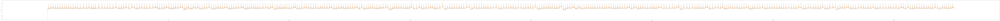

In [4]:
# Filter the signal and Plot
# Store Filterd signal in var x
Nb = len(b)
x = np.zeros(len(data))
for m in range(3,len(data)):
    x[m] = b[0]*data[m]
    for i in range(1,Nb):
        x[m] += a[i]*x[m-i] + b[i]*data[m-i]
# View the result
# Plot the signal
plt.figure(figsize=(400, 8))
plt.plot(data)
plt.plot(x)
plt.ylabel("$y(t)$")


In [5]:
# Now Calculate and Create High Pass Filter

In [6]:
# Butterworth filter
wc = 2*np.pi*0.9; # cutoff frequency (rad/s) /// TODO here change FREQ
n = 2; # Filter order

# Compute the Butterworth filter coefficents
a = np.zeros(n+1);
gamma = np.pi/(2.0*n);
a[0] = 1; # first coef is always 1
for k in range(0,n):
    rfac = np.cos(k*gamma)/np.sin((k+1)*gamma);
    a[k+1] = rfac*a[k]; # Other coefficients by recursion

# print("Butterworth polynomial coefficients a_i:                " + str(a))

# Compute the coefficients
c = np.zeros(n+1);
for j in range(0,n+1):
    c[j] = a[n-j]*pow(wc,n-j)

# The transfer function form orders the terms in descending order
# So we have to flip the coefficients
c_flip = np.flip(c)
# print(c)
# print("Butterworth coefficients with frequency adjustment c_i: " + str(c))
num = np.zeros(n+1) 
num[0] = 1;         # transfer function numerator coefficients 
den = c_flip;              # transfer function denominator coefficients
highPass = signal.TransferFunction(num,den) # Transfer function

# Compute the discrete low pass with delta_t = 1/samplingFrequency
dt = 1.0/samplingFreq;
discreteHighPass = highPass.to_discrete(dt,method='tustin',alpha=0.5)
# print(discreteHighPass)

# The coefficients from the discrete form of the filter transfer function (but with a negative sign)
b = discreteHighPass.num;
a = -discreteHighPass.den;
print("Filter coefficients b_i: " + str(b))
print("Filter coefficients a_i: " + str(a))
print("Formula: \ny = {}*val + {}*prevFilterd + {}*prevUnFiltered + {}*prevprevFilterd + {}*prevprevUnfiltered".format(b[0],a[1],b[1],a[2],b[2]))

Filter coefficients b_i: [ 0.96852263 -1.93704526  0.96852263]
Filter coefficients a_i: [-1.          1.93605419 -0.93803633]
Formula: 
y = 0.9685226296016372*val + 1.936054188800943*prevFilterd + -1.9370452592032743*prevUnFiltered + -0.9380363296056057*prevprevFilterd + 0.9685226296016372*prevprevUnfiltered


Text(0, 0.5, '$y(t)$')

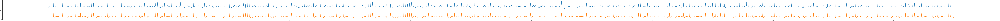

In [7]:
# Filter and Plot the signal
Nb = len(b)
yfilt = np.zeros(len(x))
for m in range(3,len(x)):
    yfilt[m] = b[0]*x[m]
    for i in range(1,Nb):
        yfilt[m] += a[i]*yfilt[m-i] + b[i]*x[m-i]
    
# View the result
# Plot the signal
plt.figure(figsize=(400, 8))
plt.plot(x)
plt.plot(yfilt)
plt.ylabel("$y(t)$")

In [8]:
# Now Implemantation simple functions to apply filters

In [9]:
# Low Pass Filter Function with Coffecient Values
prevFilterd =  0.0
prevUnFiltered =  0.0
prevprevUnfiltered =  0.0
prevprevFilterd =  0.0
def lowPassFilter(val):
    global prevFilterd, prevUnFiltered, prevprevUnfiltered, prevprevFilterd;
    y = 0.2564056711091054*val + 0.14992656822522105*prevFilterd + 0.5128113422182107*prevUnFiltered - 0.1755492526616423*prevprevFilterd +  0.2564056711091051*prevprevUnfiltered
    # y = 0.2564*val +  0.1499*prevFilterd +  0.5128*prevUnFiltered - 0.1755*prevprevFilterd + 0.2564*prevprevUnfiltered;
    prevprevFilterd =  prevFilterd
    prevFilterd =  y
    prevprevUnfiltered =  prevUnFiltered
    prevUnFiltered =  val
    return y

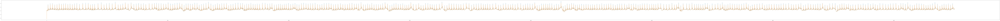

In [10]:
# Now Apply Low Pass Filter And Plot
lowPass = np.zeros(len(data))
for i in range(0, len(data)):
    lowPass[i] = lowPassFilter(data[i])

plt.figure(figsize=(400, 8))
plt.plot(data)
plt.plot(lowPass)

In [11]:
##Now Apply High Pass on previosly Filterd signal

In [12]:
#Function For High Pass Filter
hprevFilterd =  0.0
hprevUnFiltered =  0.0
hprevprevUnfiltered =  0.0
hprevprevFilterd =  0.0


def filterDataHighPass(val):
    global hprevFilterd, hprevUnFiltered, hprevprevUnfiltered, hprevprevFilterd
    y = 0.9823863574202832*val + 1.9644624503696302*hprevFilterd - 1.9647727148405665*hprevUnFiltered - 0.9650829793115031*hprevprevFilterd + 0.9823863574202832*hprevprevUnfiltered;
    # y = 0.9982*val +  1.9964*hprevFilterd -1.9964*hprevUnFiltered - 0.9964*hprevprevFilterd + 0.9982*hprevprevUnfiltered;
    hprevprevFilterd =  hprevFilterd
    hprevFilterd =  y
    hprevprevUnfiltered =  hprevUnFiltered
    hprevUnFiltered =  val
    return y;


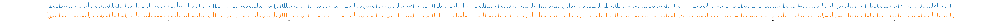

In [13]:
## Apply High pass and Plot Signal
finalSignal = np.zeros(len(data))
for i in range(0, len(data)):
    finalSignal[i] = filterDataHighPass(data[i])
    
plt.figure(figsize=(400, 8))
plt.plot(data)
plt.plot(finalSignal)

In [14]:
##Now Plot All The Signals Together

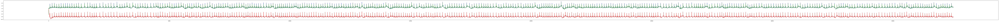

In [15]:
plt.figure(figsize=(200, 4))
plt.plot(data, color="blue")
plt.plot(lowPass, color="green")
plt.plot(finalSignal, color="red")

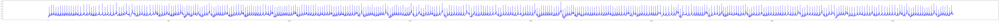

In [16]:
plt.figure(figsize=(200, 4))
plt.plot(data , color="blue")

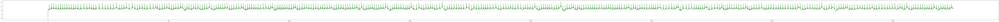

In [17]:
plt.figure(figsize=(200, 4))
plt.plot(lowPass, color="green")

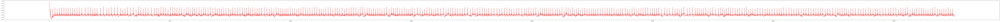

In [18]:
plt.figure(figsize=(200, 4))
plt.plot(finalSignal, color="red")